# Three Voice Clustering Project
*Author: Tetiana Kushniruk*

Welcome to the "Three Voice Clustering" project! In this project, we aim to automatically cluster audio files based on the distinct voices they contain. The objective is to develop a script that can identify and group audio segments from three different individuals. This report will guide you through the various steps involved in the project, including audio data preprocessing, feature extraction, and clustering.

We will leverage popular Python libraries such as `librosa` for audio processing and `scikit-learn` for PCA and clustering.

## Import libraries

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio
import librosa
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering

## Audio Feature Visualization

In this section, we visualize various audio features extracted from the audio files in our dataset. Visualization is a crucial step to gain insights into the characteristics of the audio data and understand how different features are represented over time.

For each audio file in the dataset, we perform the following visualizations:

1. **Waveform**: We display the audio waveform, which represents the amplitude of the audio signal over time.
2. **Frequency Magnitude**: We compute the magnitude spectrum using the Fast Fourier Transform (FFT) and plot it. This spectrum shows the distribution of frequencies in the audio signal.
3.  **Spectrogram**: We compute the Short-Time Fourier Transform (STFT) of the audio signal to generate a spectrogram. The spectrogram displays the intensity of different frequencies over time, providing insights into the frequency components present in the audio.
4. **MFCC (Mel-Frequency Cepstral Coefficients)**: MFCCs are commonly used audio features for speech and audio analysis. We compute the MFCCs of the audio signal to visualize its representation in the frequency domain over time.

Let's proceed to visualize these audio features for each audio file in our dataset.

In [2]:
AUDIO_FOLDER = 'audio'

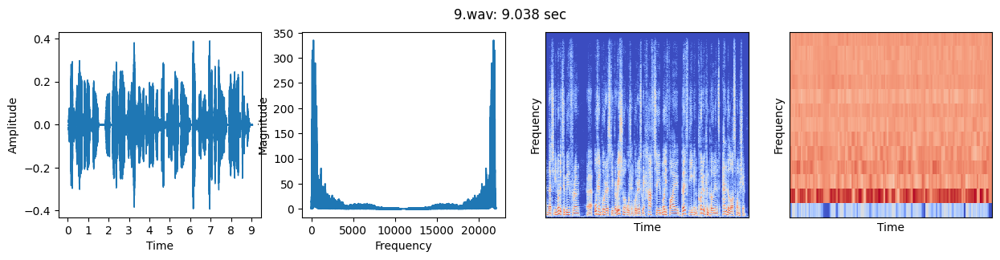

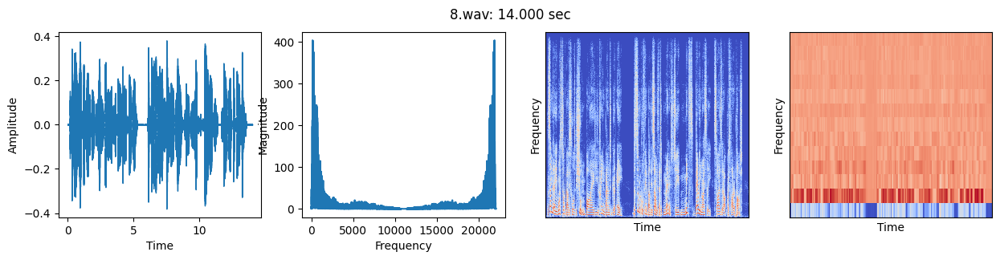

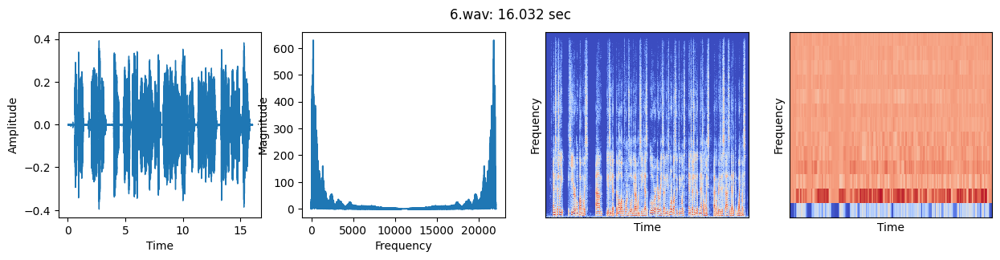

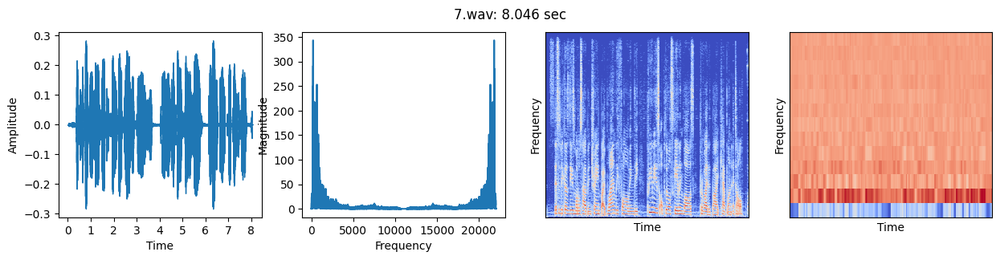

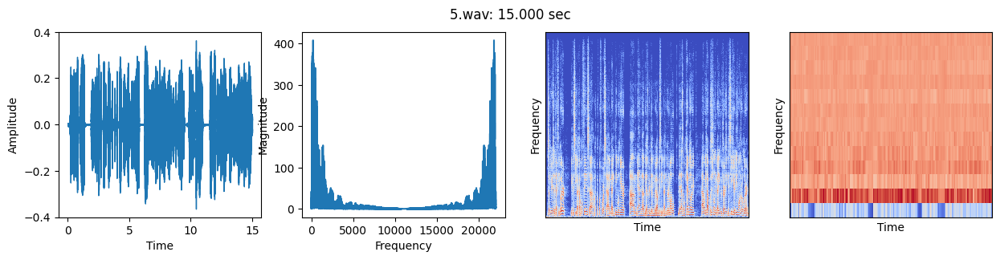

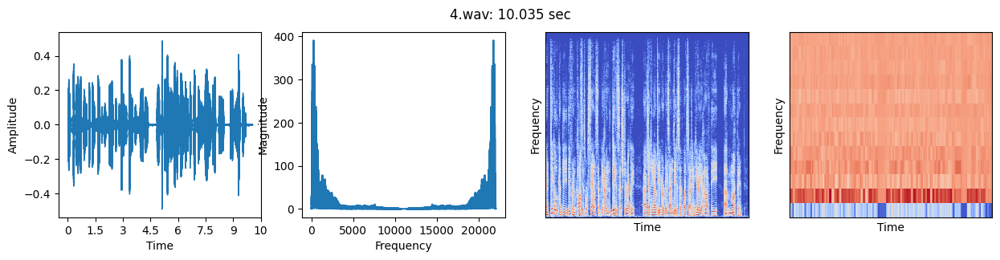

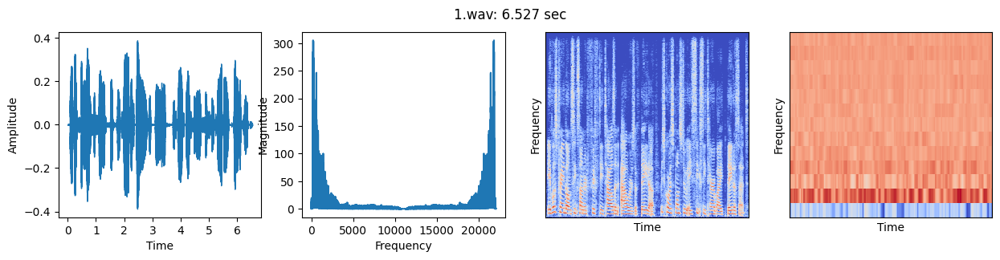

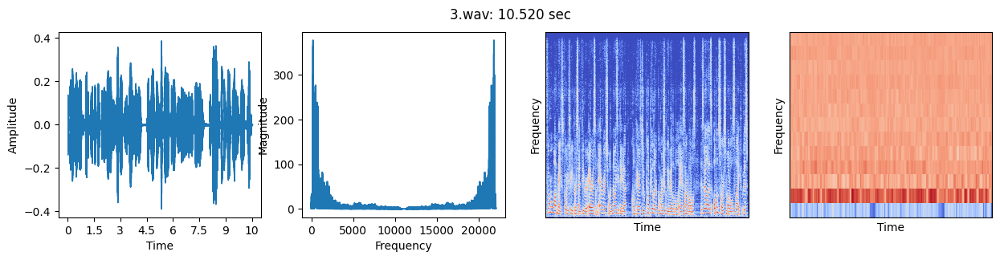

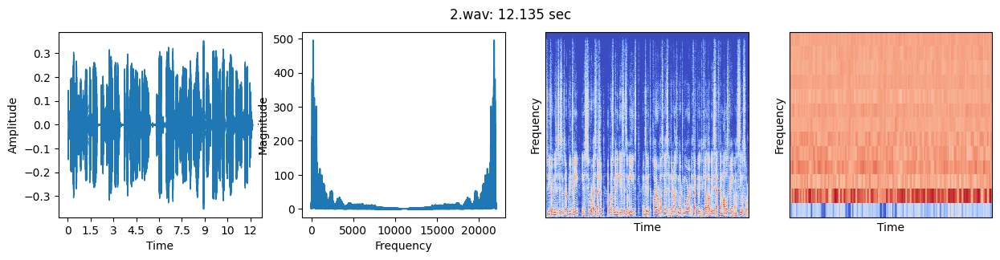

In [3]:
for file_name in os.listdir(AUDIO_FOLDER):
    audio_path = os.path.join(AUDIO_FOLDER, file_name)
    audio, sr = librosa.load(audio_path)
    
    plt.figure(figsize=(15, 3))
    
    plt.subplot(141)
    librosa.display.waveshow(audio, sr=sr)
    plt.xlabel('Time')
    plt.ylabel("Amplitude")
    
    fft = np.fft.fft(audio)
    magnitude = np.abs(fft)
    frequency = np.linspace(0, sr, len(magnitude))
    
    plt.subplot(142)
    plt.plot(frequency, magnitude)
    plt.xlabel('Frequency')
    plt.ylabel("Magnitude")
    
    stft = librosa.core.stft(audio)
    spectrogram =np.abs(stft)
    log_spectrogram = librosa.amplitude_to_db(spectrogram)
    
    plt.subplot(143)
    librosa.display.specshow(log_spectrogram, sr=sr)
    plt.xlabel('Time')
    plt.ylabel("Frequency")
    
    mfccs = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=13)
    plt.subplot(144)
    librosa.display.specshow(mfccs, sr=sr)
    plt.xlabel('Time')
    plt.ylabel("Frequency")
    
    plt.suptitle(f'{file_name}: {librosa.get_duration(y=audio):.3f} sec')
    plt.show()

## Audio Feature Extraction

In this section, we define functions for extracting relevant audio features from the audio signal. These features will be used as input for our clustering algorithm to group audio segments based on their content.

The following features are extracted:

1. **MFCC (Mel-Frequency Cepstral Coefficients)**, which were visualized in previous section.

2. **Zero Crossing Rate (ZCR)**: ZCR measures the rate at which the audio signal changes its sign. It provides information about the noisiness of the signal.

We then define a function to flatten these features into a single vector for each audio segment, making it suitable for clustering algorithms.

Let's proceed to extract and flatten these audio features.


In [4]:
def extract_features(signal, sr):
    mfccs = librosa.feature.mfcc(y=signal, sr=sr, n_mfcc=13)
    zcr = librosa.feature.zero_crossing_rate(y=signal)
    return mfccs, zcr

def flatten_features(features):
    return np.concatenate([f.flatten() for f in features])

### Audio Segmentation and Feature Extraction

Now, when we have defined functions for feature extraction we perform audio segmentation. It allows us to divide the audio files into smaller segments, making it easier to analyze and extract meaningful features. The extracted features will serve as the basis for clustering audio segments.

The following steps are carried out:

1. **Iterating Through Audio Files**: We iterate through each audio file in the specified folder and load it using the `librosa` library.

2. **Segmentation**: For each audio file, we divide it into smaller segments of fixed duration (`segment_length`). 

3. **Feature Extraction**: We extract relevant audio features from each segment using the `extract_features` and `flatten_features` functions. These features include MFCCs and zero-crossing rate (ZCR).

4. **Data Collection**: Extracted features, along with information about the original audio file and segment number, are stored in a structured format for further analysis.

In [5]:
segment_length = 2  # Length of each audio segment in seconds

In [6]:
data = []
for file_name in os.listdir(AUDIO_FOLDER):
    audio_path = os.path.join(AUDIO_FOLDER, file_name)
    audio, sr = librosa.load(audio_path)
    
    num_segments = len(audio) // (segment_length * sr)

    for i in range(num_segments):
            start_time = i * segment_length
            end_time = (i + 1) * segment_length
            segment = audio[start_time * sr:end_time * sr]

            extracted_features = extract_features(segment, sr)

            features = flatten_features(extracted_features)
            segment_info = {
                "features": features,
                "file_name": file_name,
                "segment_number": i
            }

            data.append(segment_info)


## Clustering

In this section, we perform **hierarchical clustering** on the audio segments using the features extracted earlier. Hierarchical clustering is a powerful technique that groups data points into a hierarchical structure, allowing us to discover nested clusters.

***Why Hierarchical Clustering?***

- **Small Dataset**: Hierarchical clustering is a good choice when working with small datasets. Unlike some other clustering methods, hierarchical clustering does not require specifying the number of clusters in advance, making it flexible for datasets of varying sizes.

- **Nested Clusters**: Hierarchical clustering builds a hierarchical structure of clusters, allowing us to explore nested clusters within the data. This can be advantageous when dealing with audio data, as it enables us to discover finer-grained patterns and groupings within the audio segments.

- **Dendrogram Visualization**: One of the significant advantages of hierarchical clustering is its dendrogram visualization. The dendrogram provides a clear graphical representation of the clustering process, showing how clusters are merged at different levels of granularity. This visualization can be insightful for understanding the relationships between audio segments.

### Data Preparation
We prepare the feature data by scaling it to a specific range using `MinMaxScaler`. This step ensures that all features have the same scale, which is important for clustering.

In [7]:
X = np.array([x['features'] for x in data])
X.shape

(49, 1218)

In [8]:
min_max_scaler = MinMaxScaler(feature_range=(0, 1))
X_scaled = min_max_scaler.fit_transform(X)

### Dimensionality Reduction
Now we reduce the dimensionality of the data using Principal Component Analysis (PCA). PCA retains a sufficient percentage of variance while reducing the number of features.

In [9]:
pca = PCA(n_components=0.99)
X_pca = pca.fit_transform(X_scaled)

### Dendrogram Visualization
Let's visualize the hierarchical clustering process using a dendrogram. The dendrogram graphically represents the merging of clusters at different levels of granularity.

In [10]:
linkage_matrix = linkage(X_pca, method='ward')

The linkage matrix allows us to trace back the history of cluster mergers from the root of the dendrogram to the leaves.

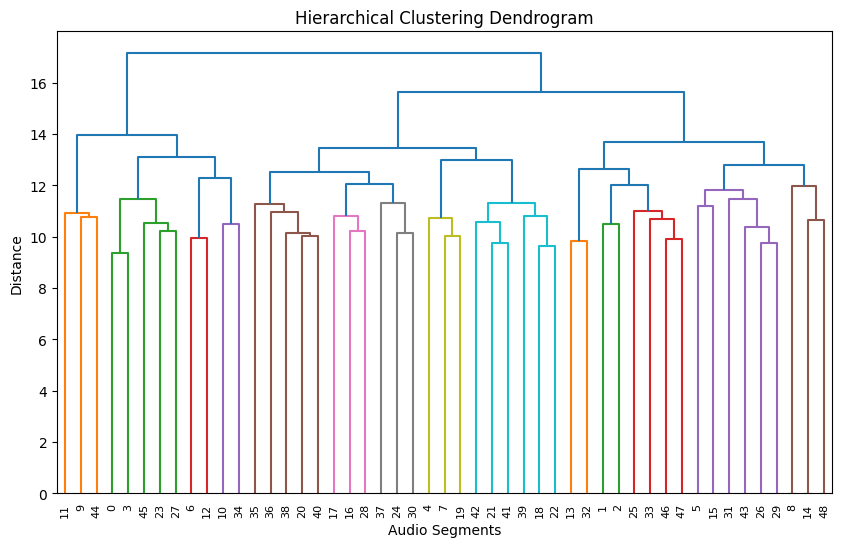

In [11]:
plt.figure(figsize=(10, 6))
dendrogram(linkage_matrix)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Audio Segments')
plt.ylabel('Distance')
plt.show()

By analyzing the dendrogram, we can see that 3 major clusters are on a distance threshold around 14.5.

### Hierarchical Clustering
Finally, we can perform hierarchical clustering using the `AgglomerativeClustering` algorithm with a specified number of clusters (`n_clusters`). This algorithm merges clusters iteratively based on their proximity.

By utilizing hierarchical clustering, we aim to group audio segments into three clusters, each representing a distinct voice in the audio data.

In [12]:
model = AgglomerativeClustering(n_clusters=3)
labels = model.fit_predict(X_pca)

## Results
### Mapping Clusters to Audio Segments

In this section, we map the cluster labels obtained from hierarchical clustering back to the original audio files and segments. This mapping allows us to associate each audio segment with its corresponding cluster label, effectively identifying the voice it belongs to.

We create a dictionary, `cluster_mapping`, to store the cluster labels for each audio segment. The dictionary is structured as follows:
   - For each audio file, there is an entry.
   - Within each file entry, segments are mapped to their respective cluster labels.

After this we display the mapping results by listing each audio file and its associated segments with their respective cluster labels.

In [13]:
cluster_mapping = {}

for i, sample_info in enumerate(data):
    file_name = sample_info['file_name']
    segment_number = sample_info['segment_number']
    cluster_label = labels[i]
    
    if file_name not in cluster_mapping:
        cluster_mapping[file_name] = {}
    
    cluster_mapping[file_name][segment_number] = cluster_label

for file_name, segment_clusters in cluster_mapping.items():
    print(f"File: {file_name}")
    for segment_number, cluster_label in segment_clusters.items():
        print(f"  Segment {segment_number}: Cluster {cluster_label}")

File: 9.wav
  Segment 0: Cluster 0
  Segment 1: Cluster 1
  Segment 2: Cluster 1
  Segment 3: Cluster 0
File: 8.wav
  Segment 0: Cluster 2
  Segment 1: Cluster 1
  Segment 2: Cluster 0
  Segment 3: Cluster 2
  Segment 4: Cluster 1
  Segment 5: Cluster 0
  Segment 6: Cluster 0
File: 6.wav
  Segment 0: Cluster 0
  Segment 1: Cluster 0
  Segment 2: Cluster 1
  Segment 3: Cluster 1
  Segment 4: Cluster 1
  Segment 5: Cluster 2
  Segment 6: Cluster 2
  Segment 7: Cluster 2
File: 7.wav
  Segment 0: Cluster 2
  Segment 1: Cluster 2
  Segment 2: Cluster 2
  Segment 3: Cluster 2
File: 5.wav
  Segment 0: Cluster 0
  Segment 1: Cluster 2
  Segment 2: Cluster 1
  Segment 3: Cluster 1
  Segment 4: Cluster 0
  Segment 5: Cluster 2
  Segment 6: Cluster 1
File: 4.wav
  Segment 0: Cluster 2
  Segment 1: Cluster 1
  Segment 2: Cluster 1
  Segment 3: Cluster 1
  Segment 4: Cluster 0
File: 1.wav
  Segment 0: Cluster 2
  Segment 1: Cluster 2
  Segment 2: Cluster 2
File: 3.wav
  Segment 0: Cluster 2
  Segme

By completing this step, we gain insights into how the audio segments have been grouped based on voice characteristics.

### Most Common Cluster Identification

In this section, we identify the most common cluster for each audio file based on the cluster labels obtained from hierarchical clustering. This information allows us to determine which voice is predominant in each audio file.

The following steps are performed:

1. **Cluster Counts**: We count the occurrences of each cluster label within the audio segments of each file using the `Counter` from the `collections` module.

2. **Most Common Cluster**: For each audio file, we identify the cluster label that appears most frequently. This cluster is considered the most common one for that file.

3. **Results Display**: We display the results by listing each cluster along with the audio files where it is the most common. This provides a clear overview of which files are predominantly associated with each voice.

In [14]:
from collections import Counter

most_common_clusters = {}

for file_name, segment_clusters in cluster_mapping.items():
    cluster_counts = Counter(segment_clusters.values())
    
    most_common_cluster = cluster_counts.most_common(1)[0][0]
    
    most_common_clusters[most_common_cluster] = most_common_clusters.get(most_common_cluster, [])
    most_common_clusters[most_common_cluster].append(file_name)

output = {cluster: file_list for cluster, file_list in most_common_clusters.items()}
print(output)

{0: ['9.wav', '8.wav'], 1: ['6.wav', '5.wav', '4.wav', '2.wav'], 2: ['7.wav', '1.wav', '3.wav']}


### Validation

In this section, we validate the accuracy of our clustering results by listening to audio samples from each detected cluster. Listening to the audio segments associated with each cluster can help confirm the correctness of the clustering process.

Let's start by listening to audio samples from Cluster 0:

In [15]:
for file_name in output[0]:
    audio_path = os.path.join(AUDIO_FOLDER, file_name)
    print(file_name)
    display(Audio(audio_path))

9.wav


8.wav


Next, we'll listen to audio samples from Cluster 1:

In [16]:
for file_name in output[1]:
    audio_path = os.path.join(AUDIO_FOLDER, file_name)
    print(file_name)
    display(Audio(audio_path))

6.wav


5.wav


4.wav


2.wav


Finally, we'll listen to audio samples from Cluster 2:

In [17]:
for file_name in output[2]:
    audio_path = os.path.join(AUDIO_FOLDER, file_name)
    print(file_name)
    display(Audio(audio_path))

7.wav


1.wav


3.wav


Cluster 2, representing a female voice, appears to have been identified accurately. All audio samples in this cluster share similar voice characteristics. This result demonstrates the effectiveness of the clustering algorithm in correctly grouping similar voice segments.

Clusters 0 and 1 consist of male voices. While the clustering algorithm correctly separated most of the male voices into these clusters, there are one audio that is mismatched (`4.wav`). 

The presence of this mismatched audio could be attributed to factors such as variations in pitch, speaking style, background noise, or similarities between voices which can influence the clustering results. 


## Conclusion
Overall, our clustering results have successfully separated male and female voices, with a minor exception in the male voice clusters. Further refinement and fine-tuning of the clustering parameters and feature extraction techniques may help improve the accuracy of voice clustering in future iterations of this project.